# <span style="color:blue">Cowpea - InDels Analysis</span>

#### Original Data Extracted from VCF File

In [1]:
from VCFtoTable import *
from GTtable import *
from GTplots import *
from GTplot import *
from BarPlots import *
from CTbarPlots import *
from variant_hist import*
from stats import *
from FilterVCF import *
from GTfilter import*
from CTguide import *

In [2]:
vcf_cowpea = '/home/anibal/genome_files/freebayes~bwa~GCF_004118075.1_ASM411807v1~all_samples~filtered-default.vcf'

In [3]:
samples_all, vcf_df, chrom_len = VCFtoTable(vcf_cowpea)

In [4]:
samples_all

array(['CBC1_P1', 'CBC5_A1'], dtype=object)

In [5]:
progenitor = 'CBC1_P1'
mutant = 'CBC5_A1'
samples = [progenitor, mutant]
samples

['CBC1_P1', 'CBC5_A1']

In [6]:
vcf_df

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_018051.1,11786,T,C,492.441010,22,9,13,0/1,1/1,1/8,0/13,4,snp
1,NC_018051.1,11801,TCTTCCT,CCTACCC,319.031006,26,10,16,0/1,0/1,4/6,3/13,4,complex
2,NC_018051.1,11813,AGCC,GGCT,305.860992,28,10,18,0/1,0/1,2/6,4/13,4,complex
3,NC_018051.1,11825,GGTAGGTAAT,AGTGGGGAAC,315.924988,28,9,19,0/1,0/1,1/6,6/13,4,complex
4,NC_018051.1,18327,G,A,580.976990,25,15,10,1/1,0/1,0/15,2/8,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1968687,NC_040289.1,41659114,T,C,52.265900,30,17,13,0/1,0/1,11/6,11/2,4,snp
1968688,NC_040289.1,41659137,G,C,35.938702,41,24,17,0/1,0/1,18/6,15/2,4,snp
1968689,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del
1968690,NC_040289.1,41667148,T,C,158.554993,14,10,4,0/1,0/1,5/5,1/3,4,snp


In [7]:
chrom_len

,LEN
CHROM,
NC_040279.1,42129361
NC_040280.1,33908088
NC_040281.1,65292630
NC_040282.1,42731077
NC_040283.1,48746289
NC_040284.1,34463471
NC_040285.1,40876636
NC_040286.1,38363498
NC_040287.1,43933251


## <span style="color:blue"> PART 0: Raw </span>

#### Contingency Table - RAW - All Chromosomes - (No 0/0, 0/1, 1/1 Filtered)

In [8]:
contingency_table_0 = contingency_table(samples, vcf_df, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                       
                        0/0     0/1     1/1  other
CBC1_P1_GT 0/0            0   52496  132507  45048
           0/1       287090  273476  178974  45048
           1/1       211458   19728  767915  45048
           other      45048   45048   45048  45048


#### GT Plot - RAW - All Chromosomes - (No 0/0, 1/1, 'Other' GTs Filtered)

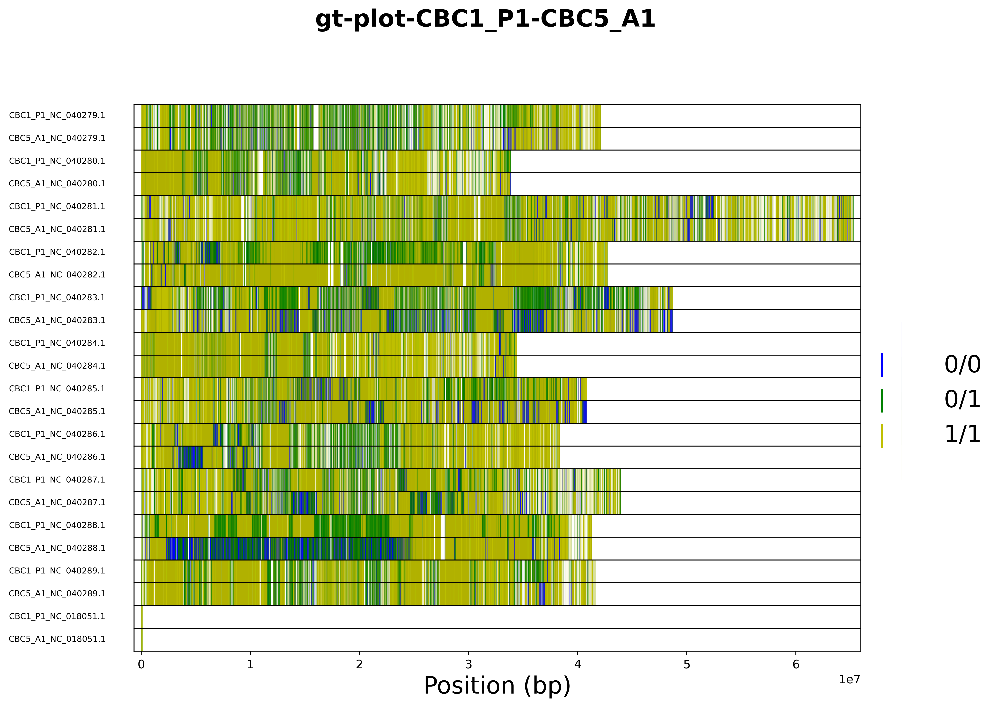

In [9]:
plt.close('all')
GTplot(samples, vcf_df, chrom_len)

#### Histograms - `DP`, `QUAL`, `TYPE` and `GT` Attributes - All Chromosomes - Unfiltered

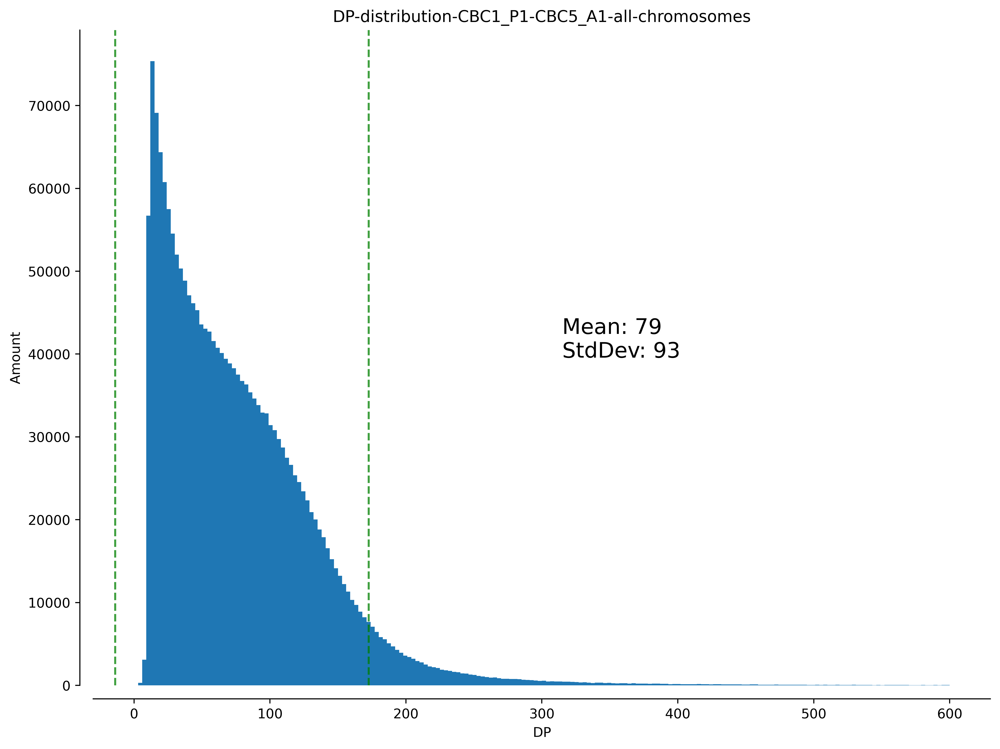

In [10]:
plot_variant_hist(samples, vcf_df, 'all', 'DP', bins=200, MSTD=True, xmax=600)

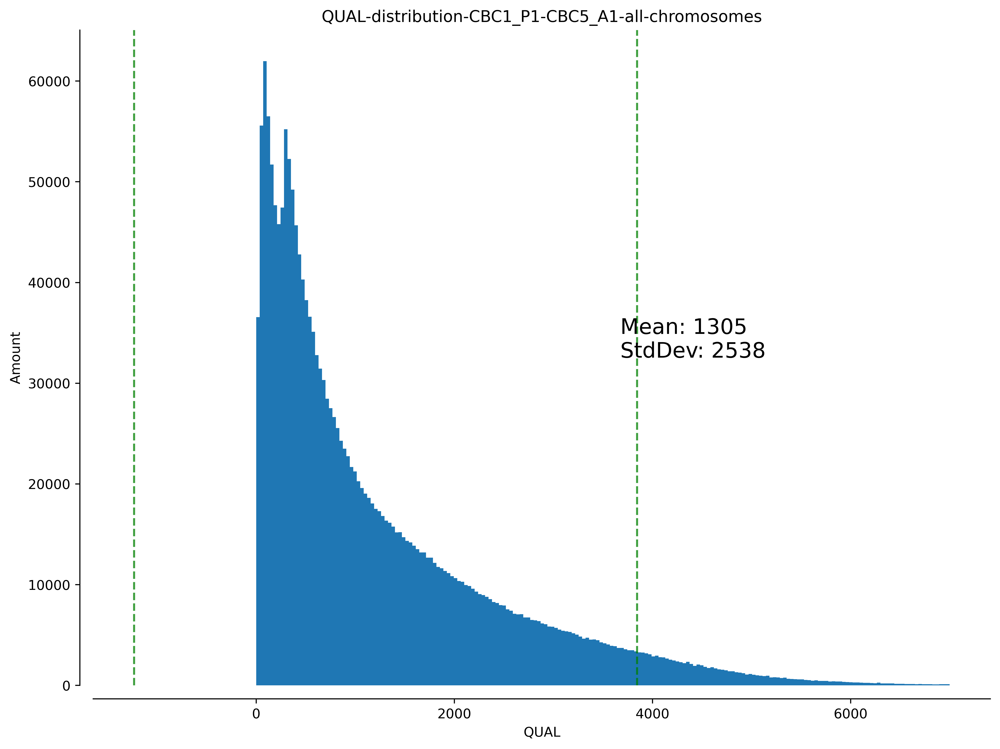

In [11]:
plot_variant_hist(samples, vcf_df, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

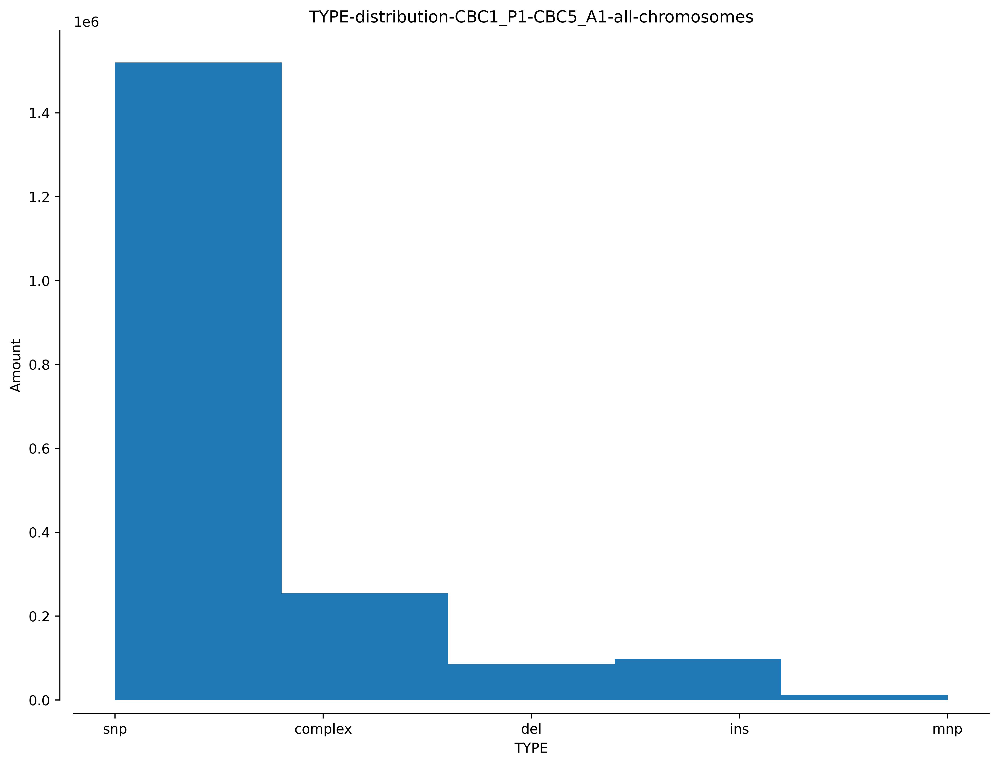

In [12]:
plot_variant_hist(samples, vcf_df, 'all', 'TYPE', bins=5)

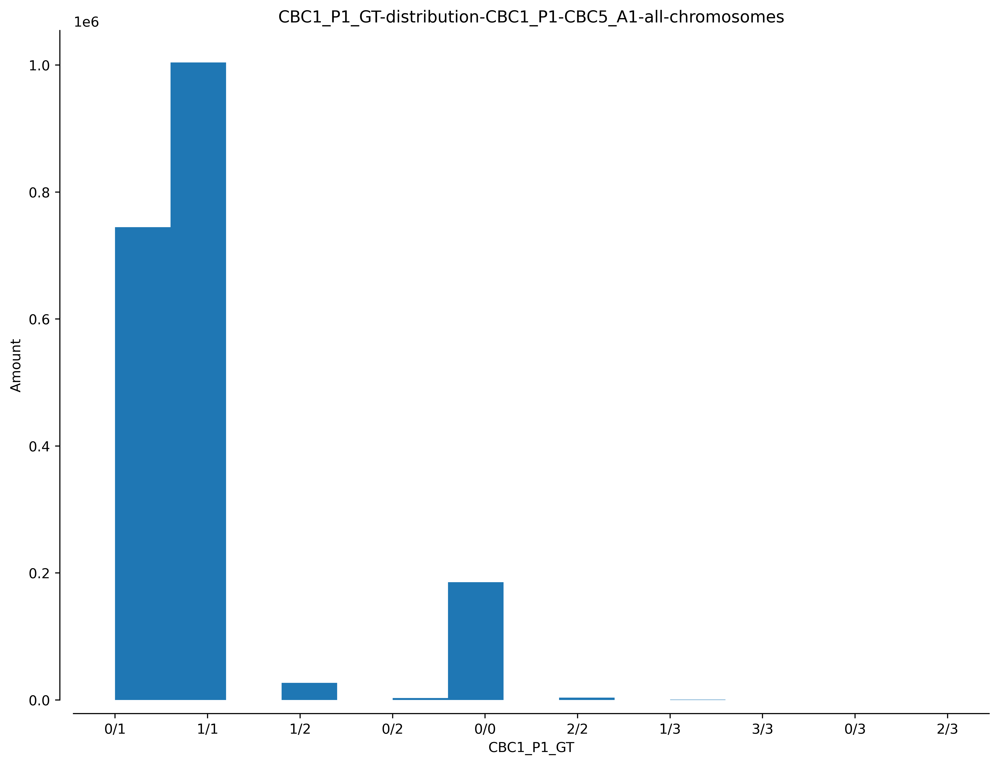

In [14]:
plot_variant_hist(samples, vcf_df, 'all', 'CBC1_P1_GT', bins=15)

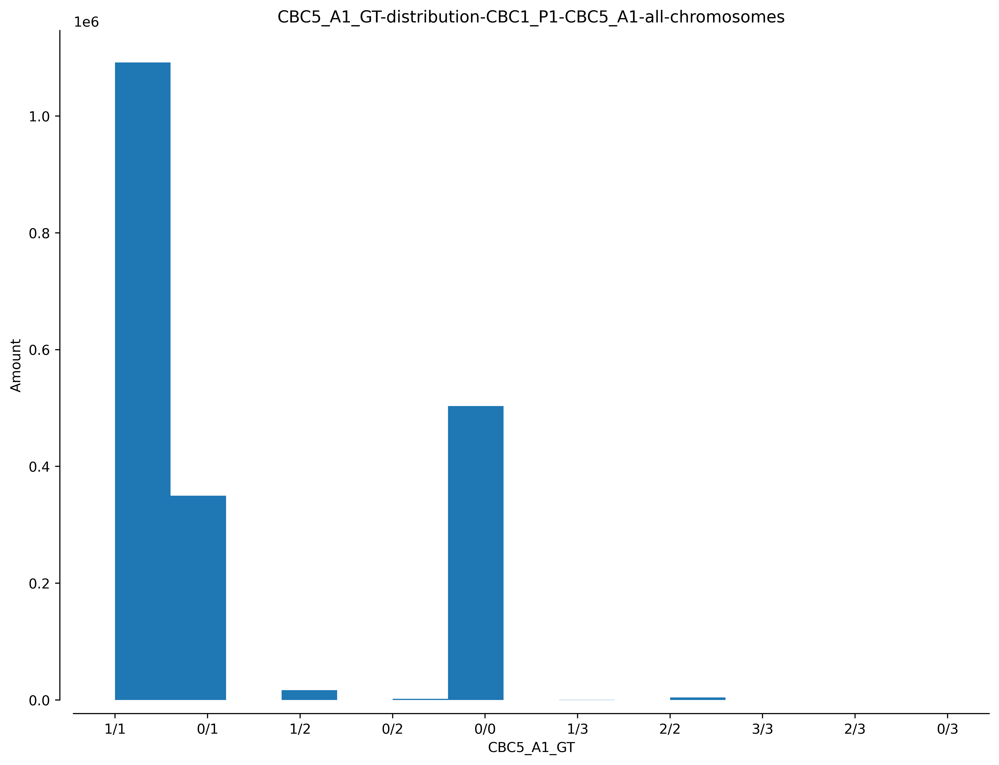

In [15]:
plot_variant_hist(samples, vcf_df, 'all', 'CBC5_A1_GT', bins=15)

#### Stacked Bar Plots - RAW

In [16]:
ct_guide()

Mutant              
                    0/0 0/1 1/1 other
Progenitor 0/0        a   b   c      
           0/1        d   e   f      
           1/1        g   h   i      
           other                    j

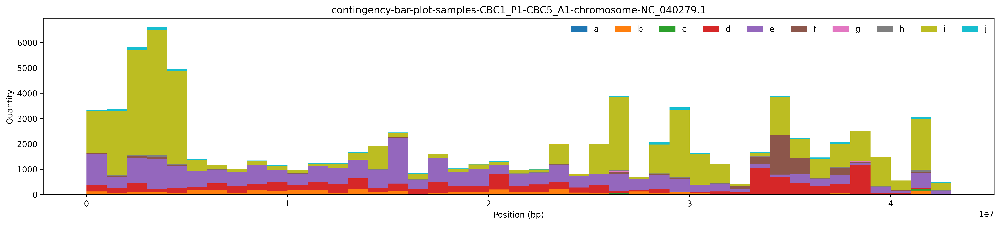

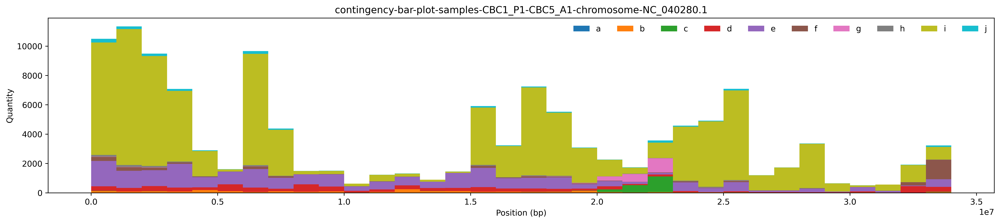

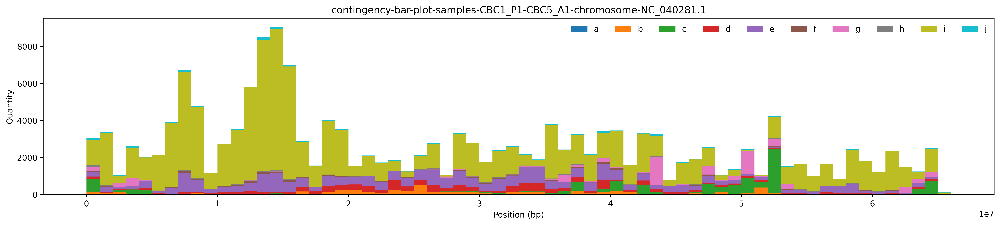

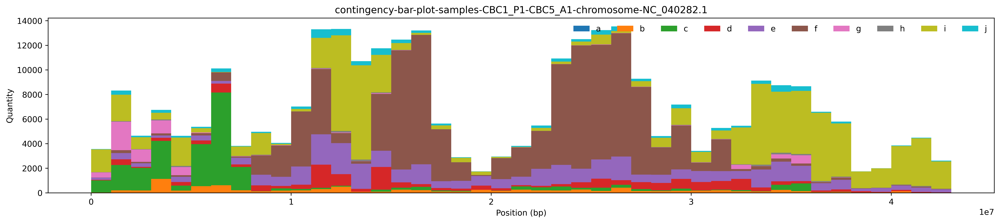

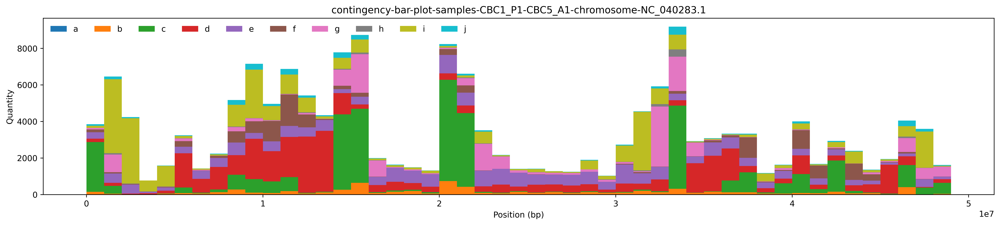

...

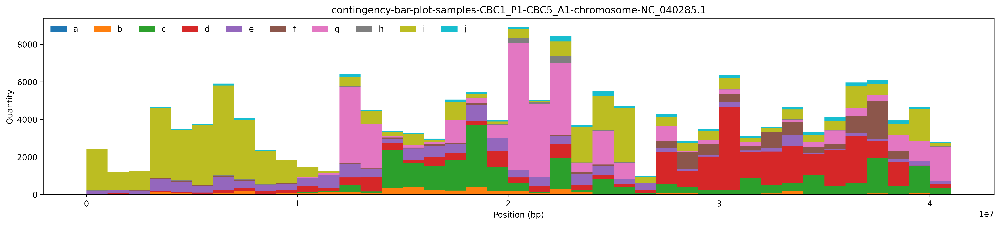

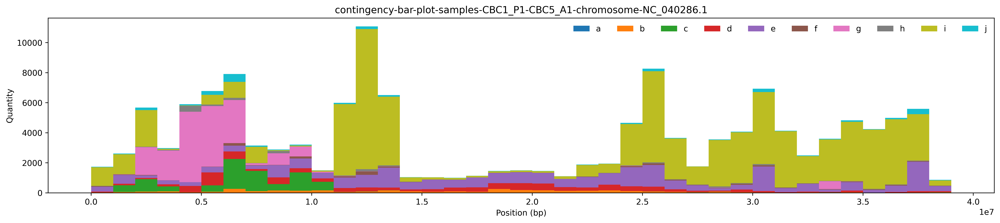

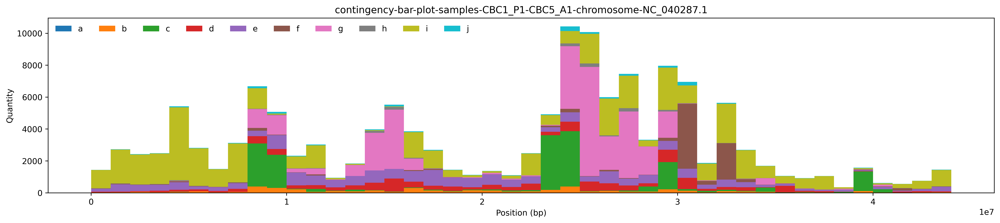

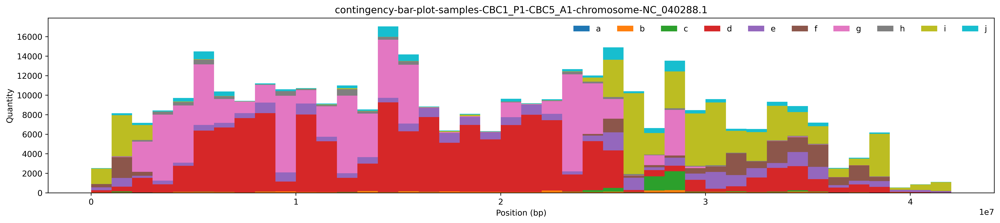

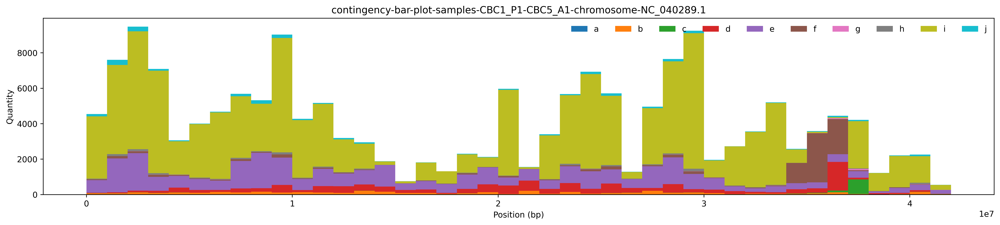

In [17]:
plt.close('all')
window_size = 1000000
CTbarPlots(samples, vcf_df, chrom_len, window_size)

## <span style="color:blue"> PART 1: Filter Out Mitochondria and Chloroplast Chromosomes </span>

#### Drop Mitochrondria and Chloroplast Chromosomes from `vcf_df` and `chrom_len`

In [18]:
drop_mito_chloro = "CHROM != NC_018051.1"
vcf_df_00 = filter_vcf(vcf_df, drop_mito_chloro)
vcf_df_00

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,912,G,T,571.966003,121,42,79,0/1,0/1,28/14,53/26,4,snp
1,NC_040279.1,948,AGGGGAAAC,AGGGAAAC,630.939026,104,39,65,0/1,0/1,26/13,41/24,4,del
2,NC_040279.1,1173,C,T,321.862000,57,34,23,0/1,0/1,22/12,16/7,4,snp
3,NC_040279.1,1390,C,T,214.576996,46,25,21,0/1,0/1,18/7,13/8,4,snp
4,NC_040279.1,1424,T,C,420.058014,71,35,36,0/1,0/1,23/12,22/14,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1968602,NC_040289.1,41659114,T,C,52.265900,30,17,13,0/1,0/1,11/6,11/2,4,snp
1968603,NC_040289.1,41659137,G,C,35.938702,41,24,17,0/1,0/1,18/6,15/2,4,snp
1968604,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del
1968605,NC_040289.1,41667148,T,C,158.554993,14,10,4,0/1,0/1,5/5,1/3,4,snp


In [19]:
mito_chloro = ['NC_018051.1']
chrom_len_00 = chrom_len.drop(mito_chloro)
chrom_len_00

,LEN
CHROM,
NC_040279.1,42129361
NC_040280.1,33908088
NC_040281.1,65292630
NC_040282.1,42731077
NC_040283.1,48746289
NC_040284.1,34463471
NC_040285.1,40876636
NC_040286.1,38363498
NC_040287.1,43933251


#### Create Mitochrondria and Chloroplast Variants and Chomosome Length Dataframes

In [20]:
drop_chrom = "CHROM!=NC_040279.1, CHROM!=NC_040280.1, CHROM!=NC_040281.1, CHROM!=NC_040282.1, CHROM!=NC_040283.1, CHROM!=NC_040284.1, CHROM!=NC_040285.1, CHROM!=NC_040286.1, CHROM!=NC_040287.1, CHROM!=NC_040288.1, CHROM!=NC_040289.1"
vcf_df_mito_chloro = filter_vcf(vcf_df, drop_chrom)
vcf_df_mito_chloro

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_018051.1,11786,T,C,492.441010,22,9,13,0/1,1/1,1/8,0/13,4,snp
1,NC_018051.1,11801,TCTTCCT,CCTACCC,319.031006,26,10,16,0/1,0/1,4/6,3/13,4,complex
2,NC_018051.1,11813,AGCC,GGCT,305.860992,28,10,18,0/1,0/1,2/6,4/13,4,complex
3,NC_018051.1,11825,GGTAGGTAAT,AGTGGGGAAC,315.924988,28,9,19,0/1,0/1,1/6,6/13,4,complex
4,NC_018051.1,18327,G,A,580.976990,25,15,10,1/1,0/1,0/15,2/8,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,NC_018051.1,129428,T,C,245.087997,20,10,10,0/1,0/1,2/7,2/7,4,snp
81,NC_018051.1,132082,C,G,586.130981,33,16,17,0/1,1/1,2/14,1/16,4,snp
82,NC_018051.1,132156,C,T,45.394600,19,10,9,0/1,0/1,6/4,7/2,4,snp
83,NC_018051.1,132169,CCGGT,ACGGG,478.346985,19,9,10,1/1,1/1,0/9,0/10,4,complex


In [21]:
mito_chloro_len = chrom_len.loc[mito_chloro]
mito_chloro_len

,LEN
CHROM,
NC_018051.1,152415


#### Contingency Table - No Mitochondria/Chloroplast

In [22]:
contingency_table_1 = contingency_table(samples, vcf_df_00, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                       
                        0/0     0/1     1/1  other
CBC1_P1_GT 0/0            0   52496  132507  45041
           0/1       287090  273450  178971  45041
           1/1       211458   19719  767875  45041
           other      45041   45041   45041  45041


#### GT Plot - No Mitochondria/Chloroplast

In [23]:
# plt.close('all')
# GTplot(samples, vcf_df_00, chrom_len_00)

#### Histograms - `DP`, `QUAL`, `TYPE` and `GT` Attributes - No Mitochondria/Chloroplast

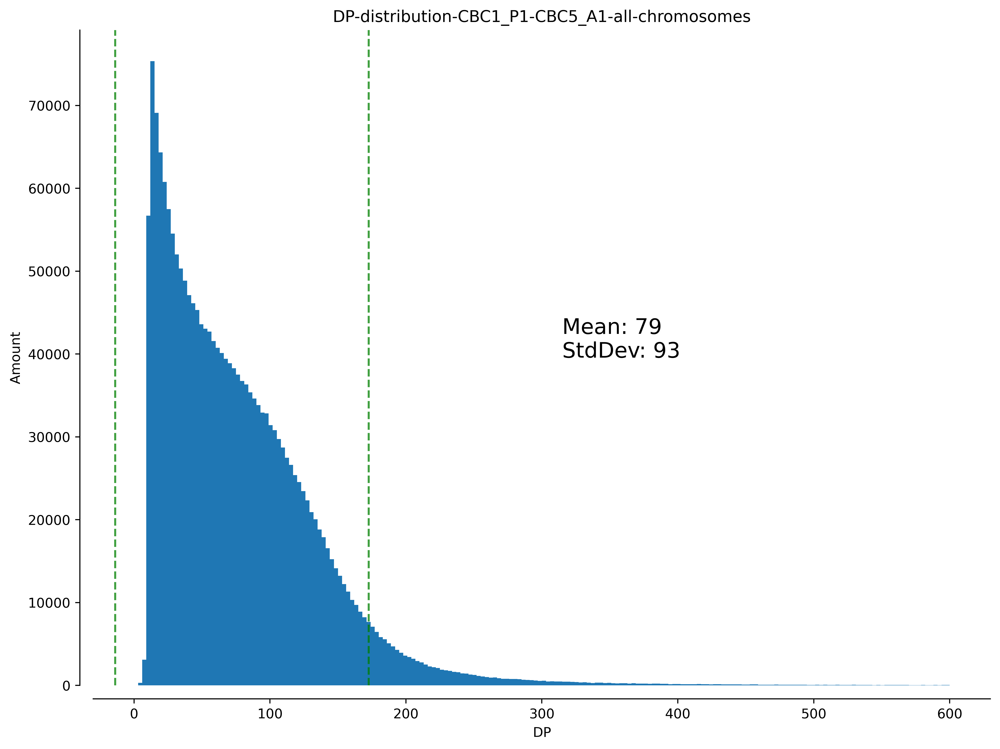

In [24]:
plot_variant_hist(samples, vcf_df_00, 'all', 'DP', bins=200, MSTD=True, xmax=600)

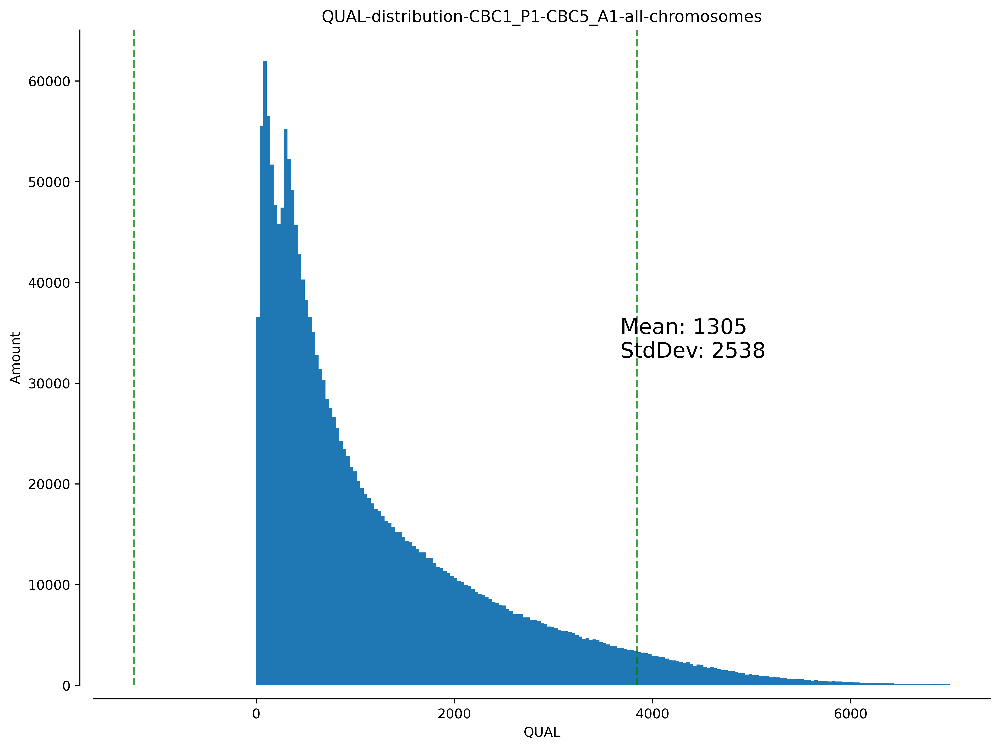

In [25]:
plot_variant_hist(samples, vcf_df_00, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

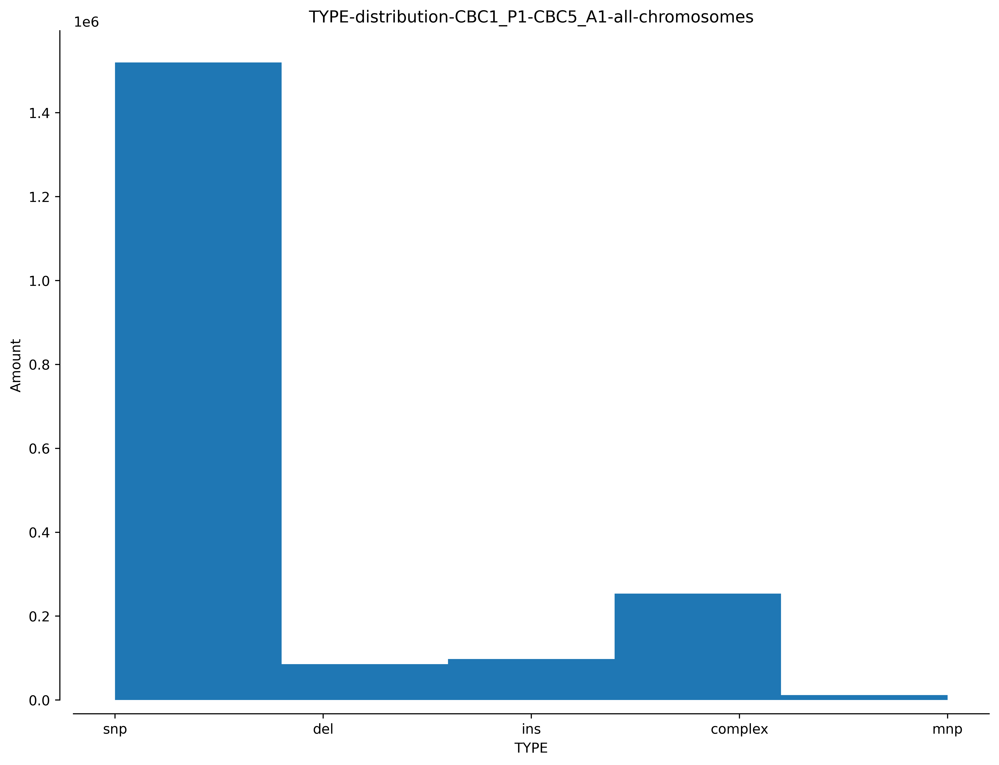

In [26]:
plot_variant_hist(samples, vcf_df_00, 'all', 'TYPE', bins=5)

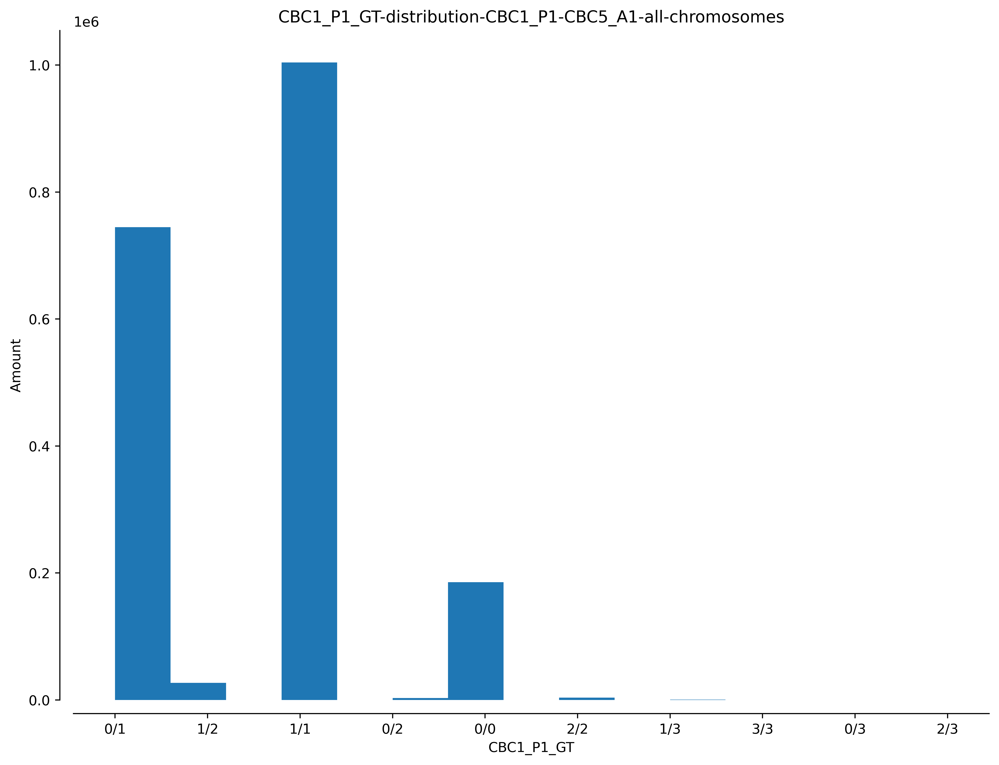

In [27]:
plot_variant_hist(samples, vcf_df_00, 'all', '%s_GT' % progenitor, bins=15)

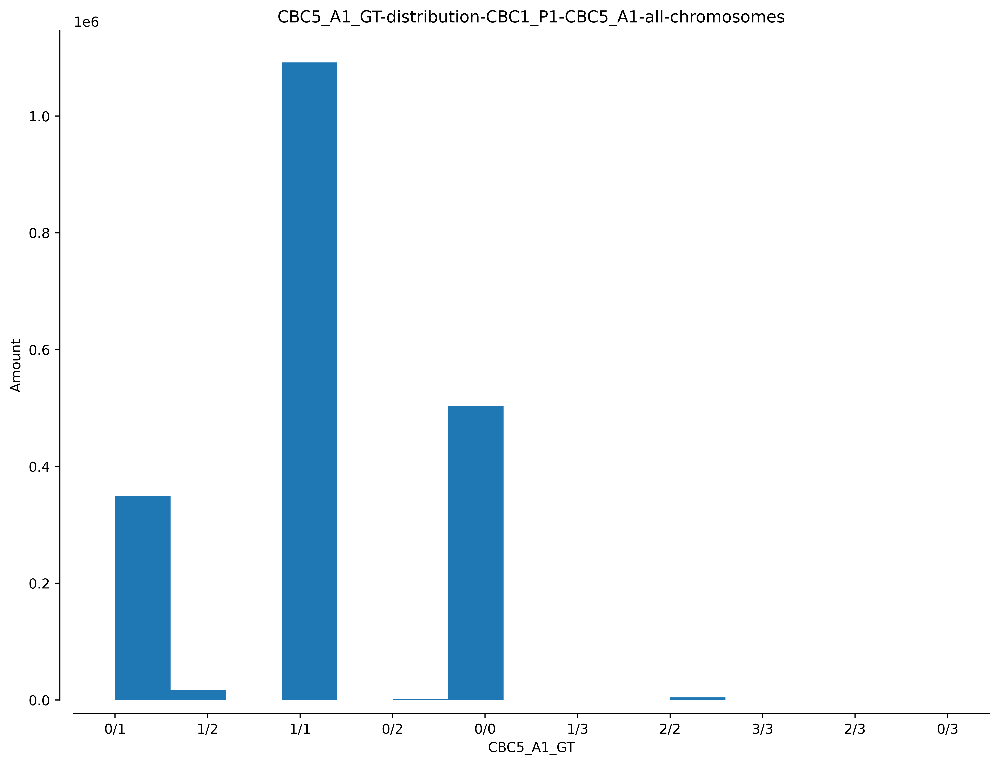

In [28]:
plot_variant_hist(samples, vcf_df_00, 'all', '%s_GT' % mutant, bins=15)

## <span style="color:blue">PART 2: Cutting Off by Mean±2StdDev Histograms of `DP` Attribute</span>

In [29]:
cutoff_left = vcf_df_00.DP.mean() - (2 * vcf_df_00.DP.std())
cutoff_right = vcf_df_00.DP.mean() + (2 * vcf_df_00.DP.std())

filter_dp = "DP >= %i, DP <= %i" % (cutoff_left, cutoff_right)
print(filter_dp)

vcf_df_01 = filter_vcf(vcf_df_00, filter_dp)
vcf_df_01

DP >= -107, DP <= 265


,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,912,G,T,571.966003,121,42,79,0/1,0/1,28/14,53/26,4,snp
1,NC_040279.1,948,AGGGGAAAC,AGGGAAAC,630.939026,104,39,65,0/1,0/1,26/13,41/24,4,del
2,NC_040279.1,1173,C,T,321.862000,57,34,23,0/1,0/1,22/12,16/7,4,snp
3,NC_040279.1,1390,C,T,214.576996,46,25,21,0/1,0/1,18/7,13/8,4,snp
4,NC_040279.1,1424,T,C,420.058014,71,35,36,0/1,0/1,23/12,22/14,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1942510,NC_040289.1,41659114,T,C,52.265900,30,17,13,0/1,0/1,11/6,11/2,4,snp
1942511,NC_040289.1,41659137,G,C,35.938702,41,24,17,0/1,0/1,18/6,15/2,4,snp
1942512,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del
1942513,NC_040289.1,41667148,T,C,158.554993,14,10,4,0/1,0/1,5/5,1/3,4,snp


#### Verify DP Histogram Cutoff Off by Mean±StdDev

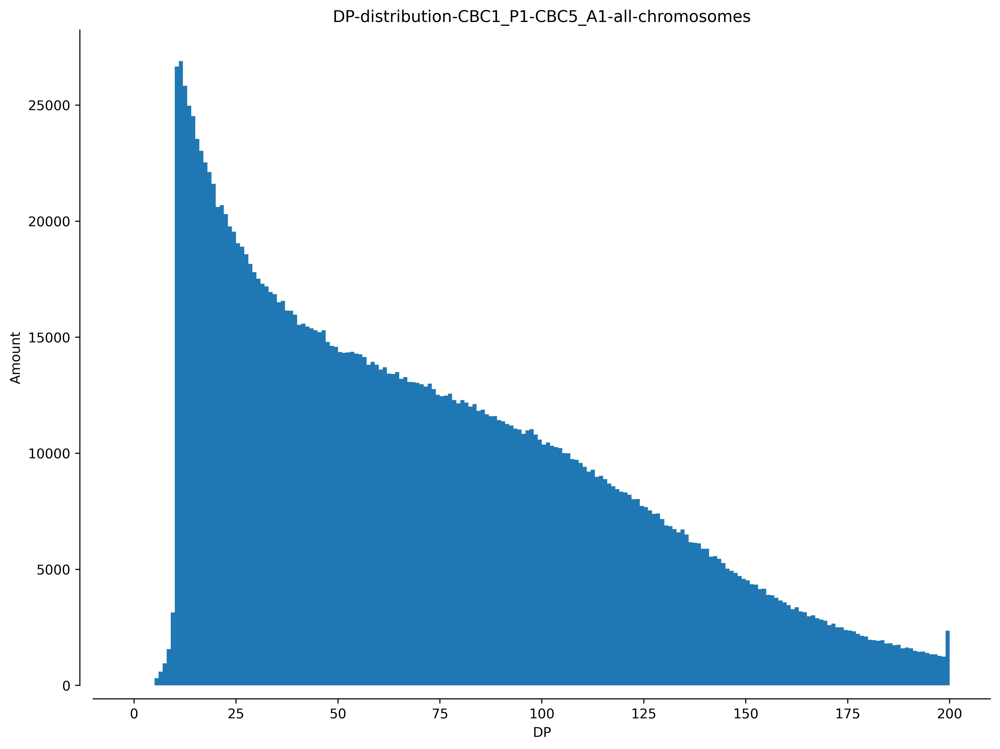

In [30]:
plot_variant_hist(samples, vcf_df_01, 'all', 'DP', bins=200, xmax=200)

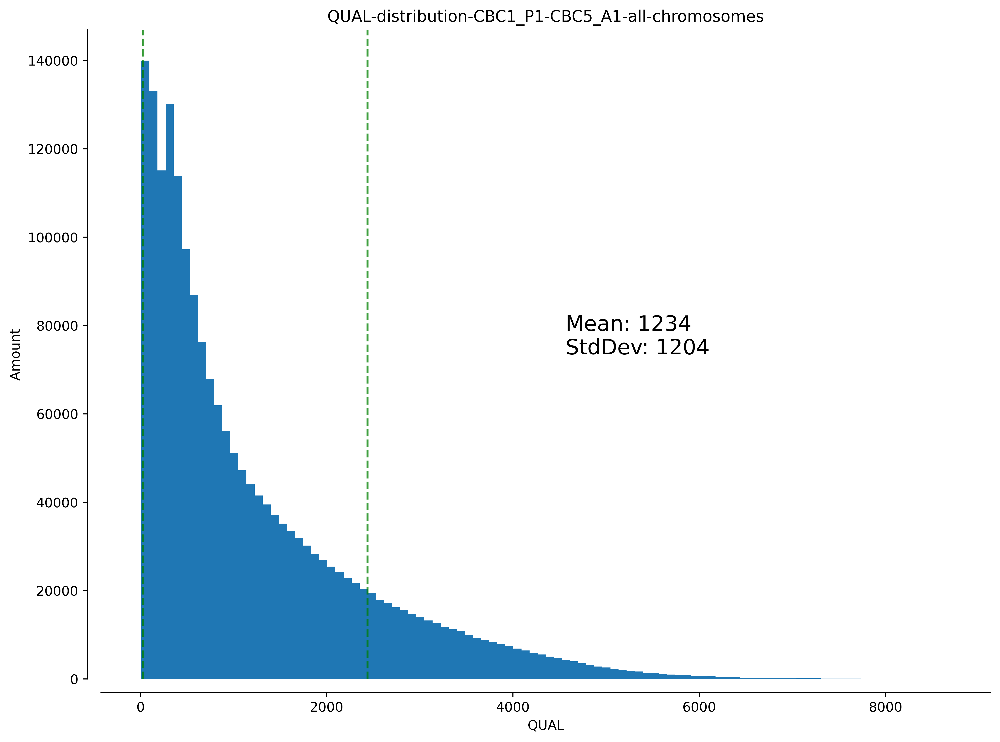

In [31]:
plot_variant_hist(samples, vcf_df_01, 'all', 'QUAL', bins=100, MSTD=True)

#### Contingency Table After DP Cutoff by Mean±StdDev

In [32]:
contingency_table_2 = contingency_table(samples, vcf_df_01, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                       
                        0/0     0/1     1/1  other
CBC1_P1_GT 0/0            0   51039  132478  43507
           0/1       284832  255445  178544  43507
           1/1       211386   19531  765753  43507
           other      43507   43507   43507  43507


#### GT Plot After DP Cutoff by Mean±StdDev

In [33]:
# plt.close('all')
# GTplot(samples, vcf_df_01, chrom_len_00)

#### Histogram 'GT' Attribute after DP Cutoff

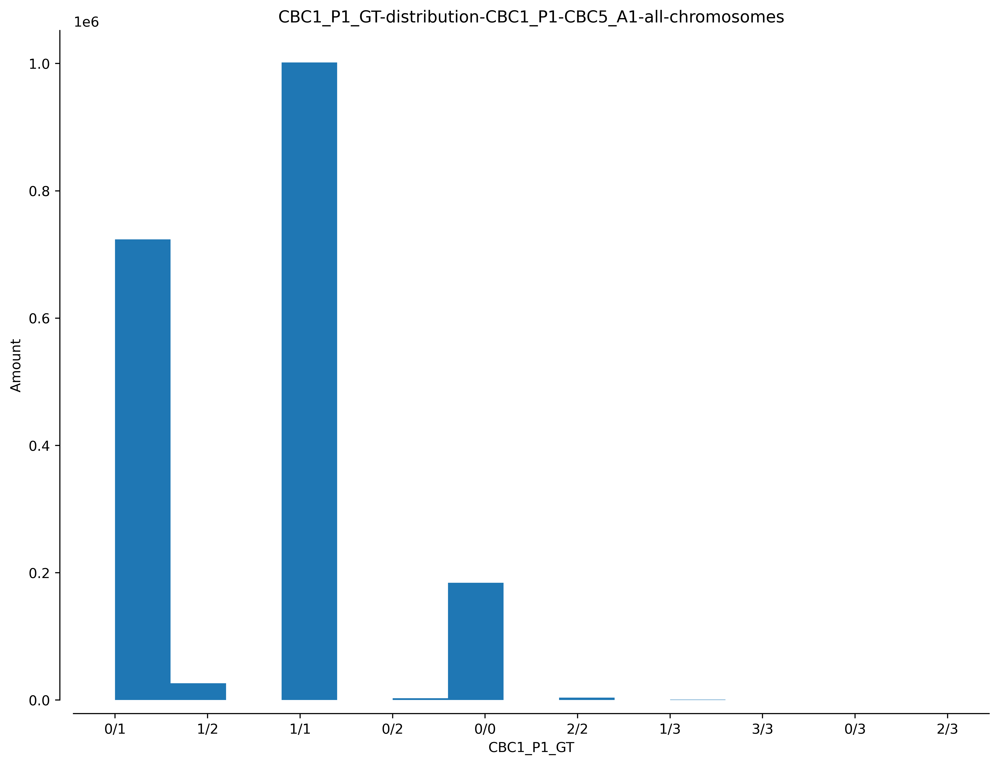

In [34]:
plot_variant_hist(samples, vcf_df_01, 'all', '%s_GT' % progenitor, bins=15)

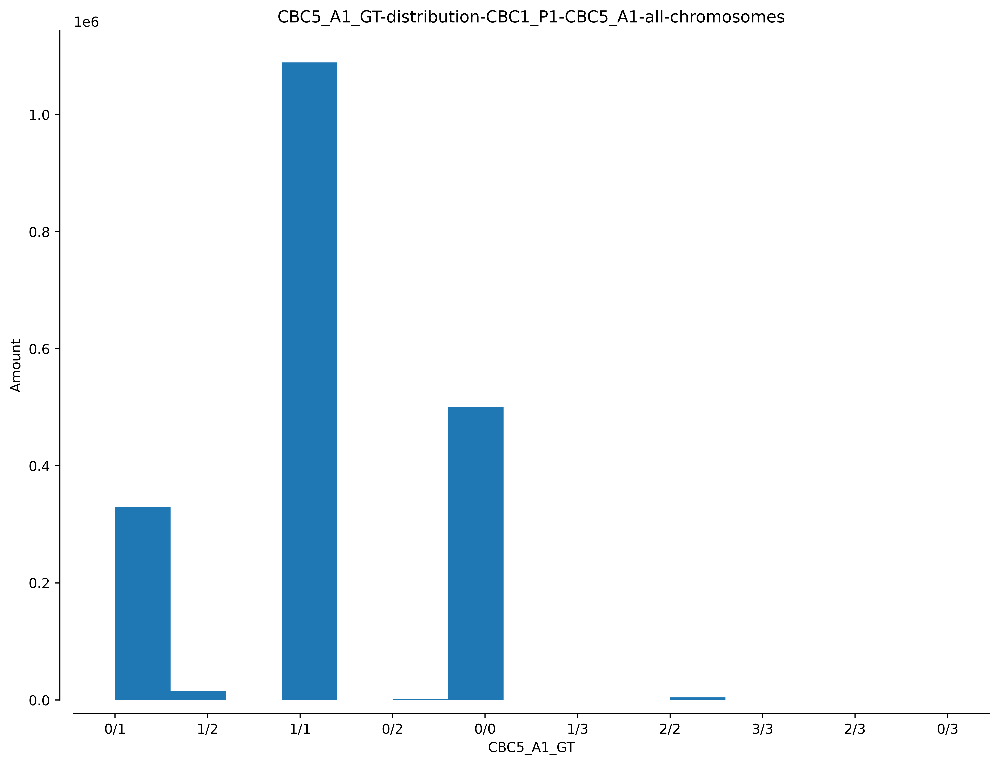

In [35]:
plot_variant_hist(samples, vcf_df_01, 'all', '%s_GT' % mutant, bins=15)

## <span style="color:blue">PART 3: Extract `ins` and `del` from `TYPE` Attribute</span>

#### Extract `ins` and `del`  `TYPE` Attribute

In [36]:
extract_type = "TYPE != snp, TYPE != complex, TYPE != mnp"
vcf_df_02 = filter_vcf(vcf_df_01, extract_type)
vcf_df_02

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,948,AGGGGAAAC,AGGGAAAC,630.939026,104,39,65,0/1,0/1,26/13,41/24,4,del
1,NC_040279.1,1432,GTTA,GTTTA,1806.530029,75,37,38,1/2,1/2,0/23,0/19,4,ins
2,NC_040279.1,5758,ATTTTTTTTTATTTTGAATTTTTTTAAAA,ATTTTTTTTTTATTTTGAATTTTTTTAAAA,348.178986,23,9,14,0/1,0/1,2/7,5/9,4,ins
3,NC_040279.1,5801,ACA,ACCA,675.890991,25,9,16,1/1,1/1,0/8,0/16,4,ins
4,NC_040279.1,7809,CTTTTTTTTTTTATAAAG,CTTTTTTTTTTATAAAG,203.059998,24,14,10,0/1,0/1,3/8,3/3,4,del
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182344,NC_040289.1,41625836,CTTTTTTTTTTTTATAAAAC,CTTTTTTTTTTTATAAAAC,127.299004,24,10,14,0/1,0/1,8/2,8/6,4,del
182345,NC_040289.1,41638190,ATTTTTTCG,ATTTTTTTCG,1102.900024,35,19,16,1/1,1/1,0/19,0/16,4,ins
182346,NC_040289.1,41638719,GTTTTTTTTTTTTTAT,GTTTTTTTTTTTTTTAT,844.987000,30,17,13,1/1,1/1,0/16,0/13,4,ins
182347,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del


#### TYPE `ins` and `del` Histogram Verification

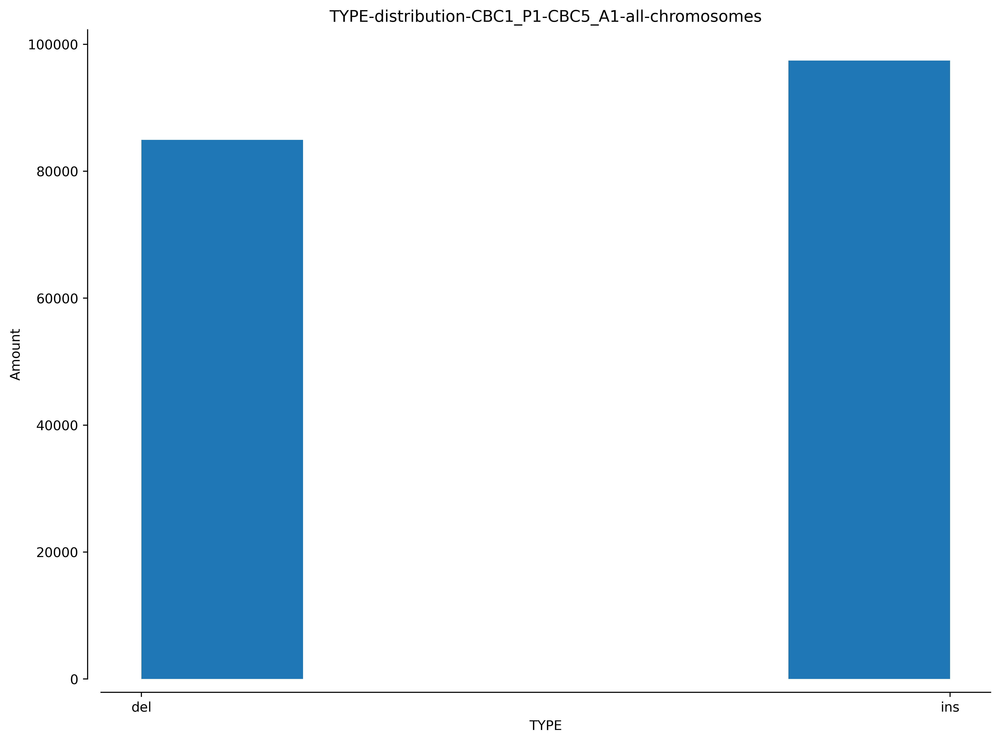

In [37]:
plot_variant_hist(samples, vcf_df_02, 'all', 'TYPE', bins=5)

#### Contingency Table - `ins` and `del` TYPE only

In [38]:
contingency_table_3 = contingency_table(samples, vcf_df_02, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                    
                        0/0    0/1    1/1 other
CBC1_P1_GT 0/0            0   2633  12472  7563
           0/1        17560  13141  14757  7563
           1/1        17378   2370  94475  7563
           other       7563   7563   7563  7563


#### GT Plot - `ins` and `del` TYPE only

In [39]:
# plt.close('all')
# GTplot(samples, vcf_df_02, chrom_len_00)

#### Histograms - DP, QUAL, and GT Attributes after TYPE Filtering

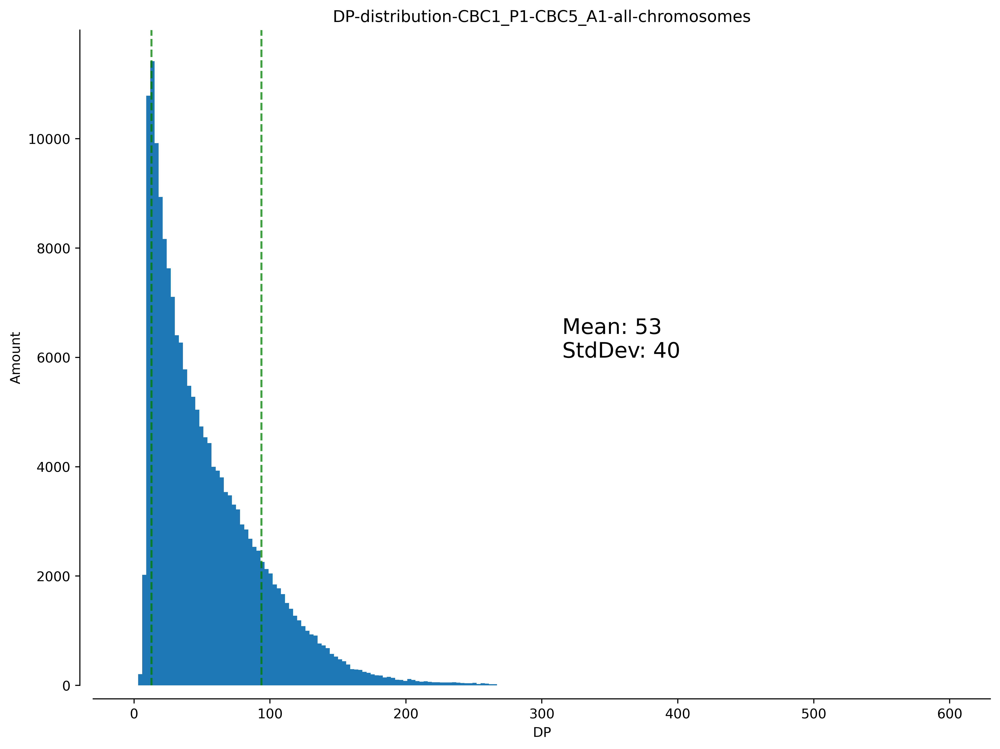

In [40]:
plot_variant_hist(samples, vcf_df_02, 'all', 'DP', bins=200, MSTD=True, xmax=600)

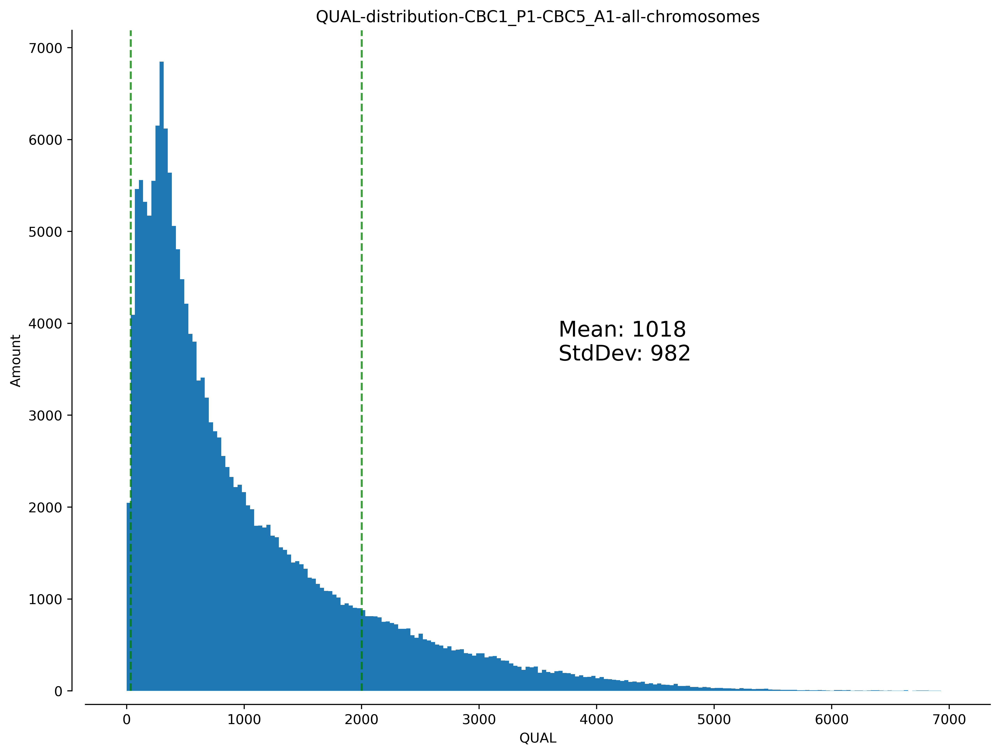

In [41]:
plot_variant_hist(samples, vcf_df_02, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

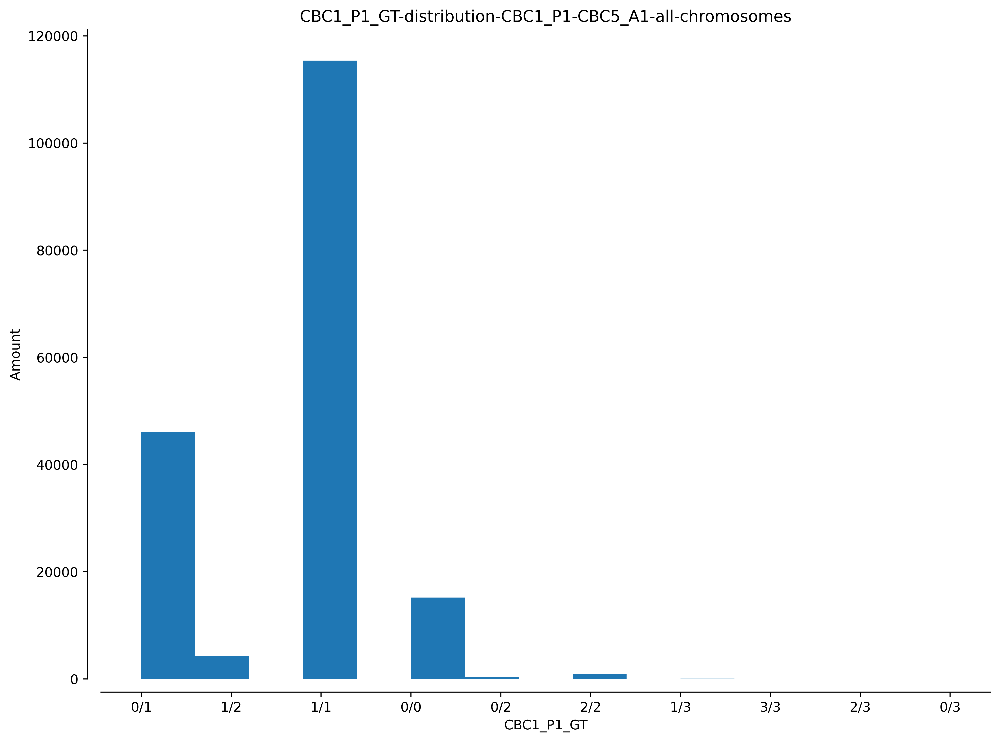

In [42]:
plot_variant_hist(samples, vcf_df_02, 'all', '%s_GT' % progenitor, bins=15)

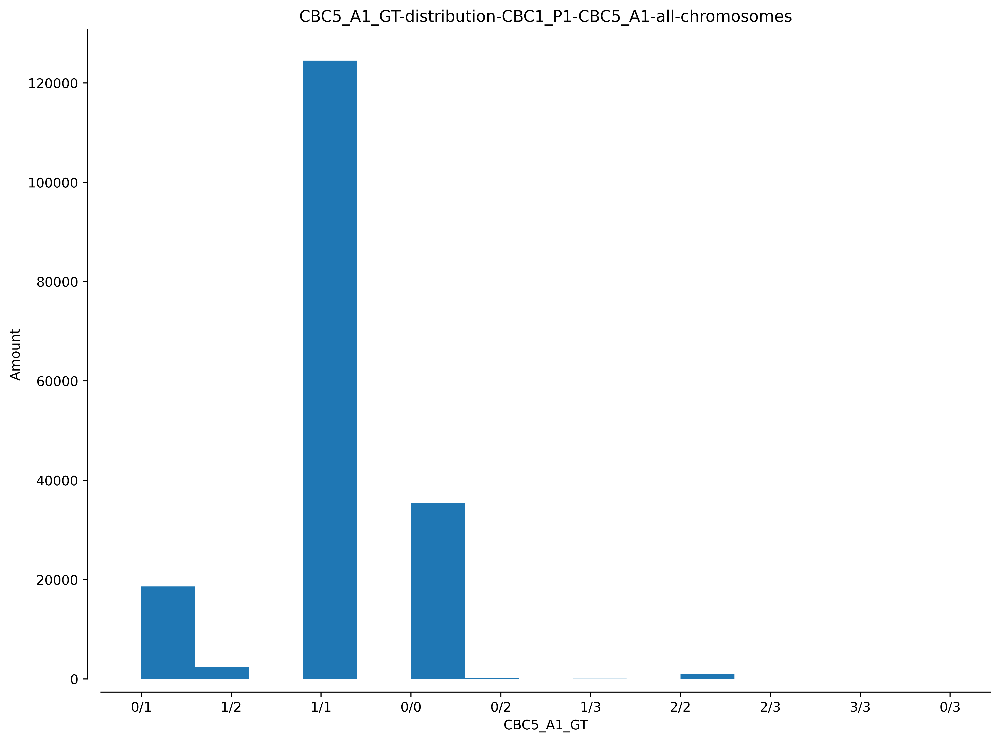

In [43]:
plot_variant_hist(samples, vcf_df_02, 'all', '%s_GT' % mutant, bins=15)

## <span style="color:blue"> PART 4: Cutting Off by Mean±StdDev Histograms of `QUAL` Attribute</span>

In [44]:
# cutoff_left = vcf_df_02.QUAL.mean() - vcf_df_02.QUAL.std()
# cutoff_right = vcf_df_02.QUAL.mean() + vcf_df_02.QUAL.std()

# filter_qual = "QUAL >= %i, QUAL <= %i" % (cutoff_left, cutoff_right)
# print(filter_qual)

# vcf_df_03 = filter_vcf(vcf_df_02, filter_qual)
# vcf_df_03

#### Verify `DP` and `QUAL` Histograms after `QUAL` Cutoff Off by Mean±StdDev

In [45]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'DP', bins=200, xmax=200)

In [46]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'QUAL', bins=100, xmax=3500)

#### Contingency Table After QUAL Cutoff by Mean±StdDev

In [47]:
# contingency_table_4 = contingency_table(samples, vcf_df_03, 'all')
# contingency_table_4

#### GT Plot After QUAL Cutoff by Mean±StdDev

In [48]:
# plt.close('all')
# GTplot(samples, vcf_df_03, chrom_len_00)

#### Histograms after QUAL Cutoff by Mean±StdDev

In [49]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'PAHAT_1_GT', bins=9)

In [50]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'GHP-2-2_GT', bins=9)

## <span style="color:blue"> PART 5: Filtering GTs 0/0, 1/1, 'Other' </span>

#### Filter out where samples GTs are the same (0/0, 1/1) and have 'Other'

In [51]:
progenitor_gts_filter = "CBC1_P1_GT != ./., CBC1_P1_GT != 0/2, CBC1_P1_GT != 1/2, CBC1_P1_GT != 2/2, CBC1_P1_GT != 0/3, CBC1_P1_GT != 1/3, CBC1_P1_GT != 2/3, CBC1_P1_GT != 3/3"
vcf_df_04 = filter_vcf(vcf_df_02, progenitor_gts_filter)

mutant_gts_filter = "CBC5_A1_GT != ./., CBC5_A1_GT != 0/2, CBC5_A1_GT != 1/2, CBC5_A1_GT != 2/2, CBC5_A1_GT != 0/3, CBC5_A1_GT != 1/3, CBC5_A1_GT != 2/3, CBC5_A1_GT != 3/3"
vcf_df_04 = filter_vcf(vcf_df_04, mutant_gts_filter)

genotypes = ['0/0', '1/1']
for genotype in genotypes:
    vcf_df_04 = filter_similar_gt(samples, vcf_df_04, genotype)

vcf_df_04

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,948,AGGGGAAAC,AGGGAAAC,630.939026,104,39,65,0/1,0/1,26/13,41/24,4,del
1,NC_040279.1,5758,ATTTTTTTTTATTTTGAATTTTTTTAAAA,ATTTTTTTTTTATTTTGAATTTTTTTAAAA,348.178986,23,9,14,0/1,0/1,2/7,5/9,4,ins
2,NC_040279.1,7809,CTTTTTTTTTTTATAAAG,CTTTTTTTTTTATAAAG,203.059998,24,14,10,0/1,0/1,3/8,3/3,4,del
3,NC_040279.1,8672,CACCCGGATGGGCCGGACGA,CA,99.697998,165,84,81,0/1,0/1,70/12,64/17,4,del
4,NC_040279.1,8980,GCCCGACGATC,GC,1791.869995,121,64,57,0/1,0/1,23/41,21/36,4,del
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80306,NC_040289.1,41489575,AAT,ATTCAT,1823.510010,121,57,64,0/1,0/1,28/29,21/43,4,ins
80307,NC_040289.1,41527433,TAAAAAAAAAAAAAAAAACACACCAACATAAG,TAAAAAAAAAAAAAAAACACACCAACATAAG,47.832600,17,8,9,0/1,0/1,5/3,6/2,4,del
80308,NC_040289.1,41551599,TAAAAAAAAAAAAAACTTCC,TAAAAAAAAAAAAAAACTTCC,194.509003,11,5,6,0/1,0/1,1/4,1/4,4,ins
80309,NC_040289.1,41625836,CTTTTTTTTTTTTATAAAAC,CTTTTTTTTTTTATAAAAC,127.299004,24,10,14,0/1,0/1,8/2,8/6,4,del


#### Contingency Table after GT Filtering

In [52]:
contingency_table_5 = contingency_table(samples, vcf_df_04, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                    
                        0/0    0/1    1/1 other
CBC1_P1_GT 0/0            0   2633  12472     0
           0/1        17560  13141  14757     0
           1/1        17378   2370      0     0
           other          0      0      0     0


#### GT Plot after GT Filtering

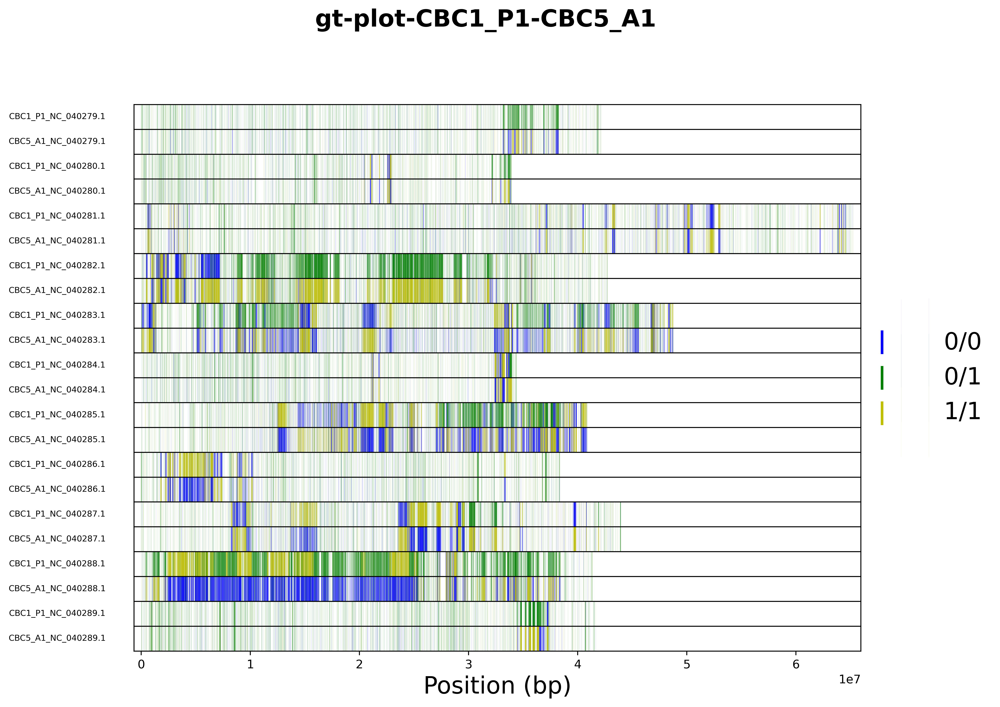

In [53]:
plt.close('all')
GTplot(samples, vcf_df_04, chrom_len_00)

#### Histograms GT after GT Filtering 

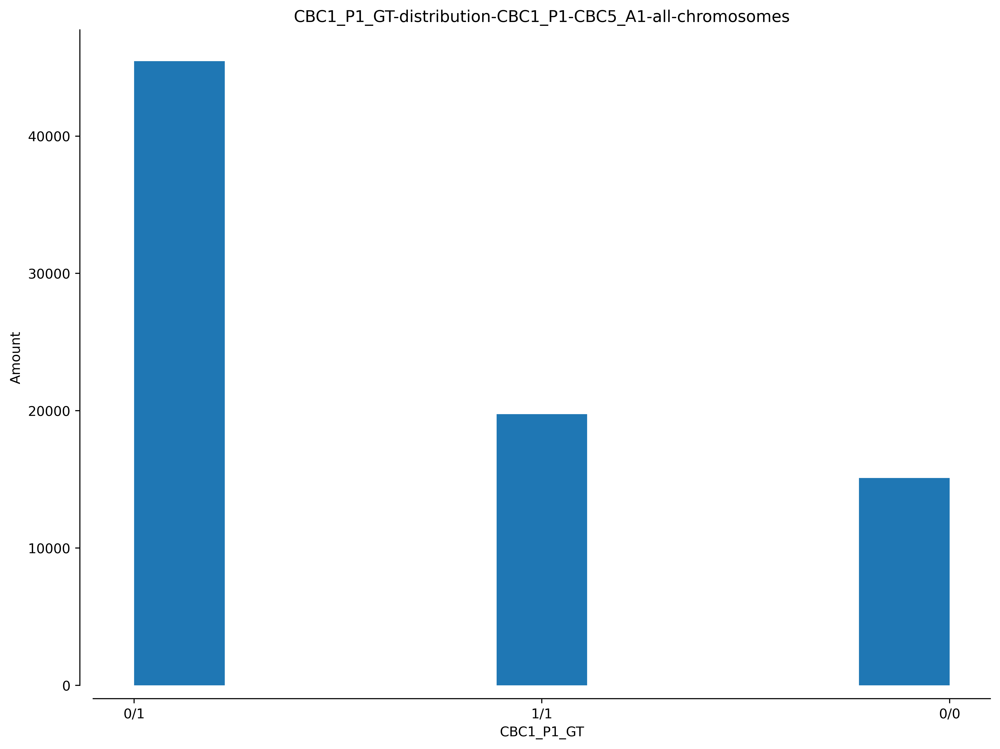

In [54]:
plot_variant_hist(samples, vcf_df_04, 'all', '%s_GT' % progenitor, bins=9)

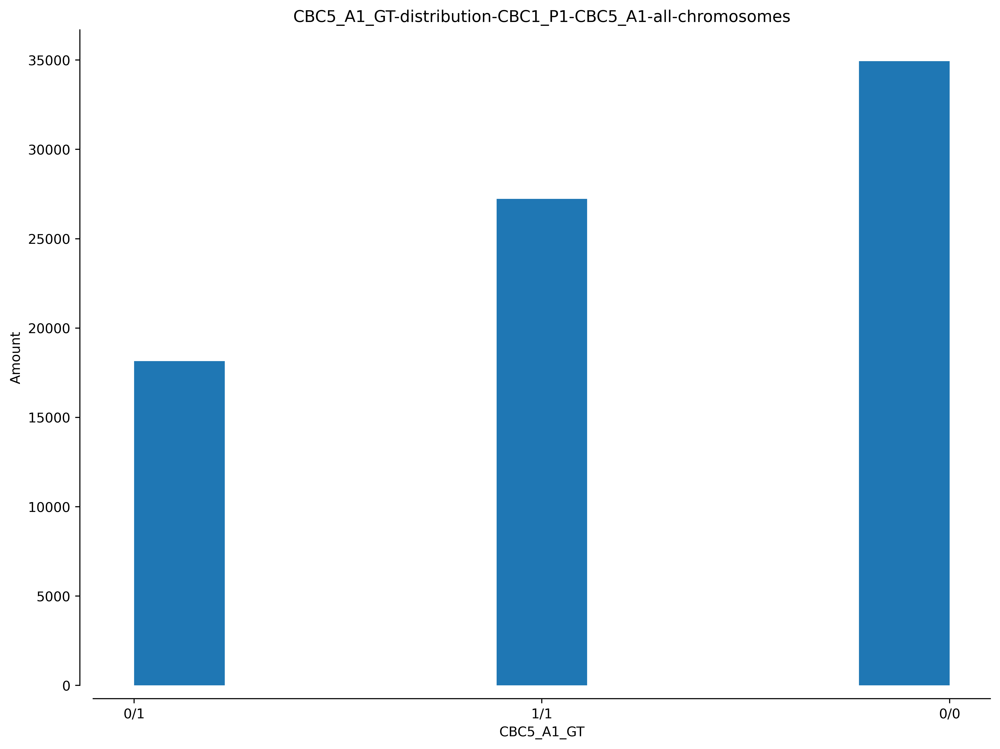

In [55]:
plot_variant_hist(samples, vcf_df_04, 'all', '%s_GT' % mutant, bins=9)

## <span style="color:blue"> PART 6: Stacked Bar Plots</span>

In [56]:
ct_guide()

Mutant              
                    0/0 0/1 1/1 other
Progenitor 0/0        a   b   c      
           0/1        d   e   f      
           1/1        g   h   i      
           other                    j

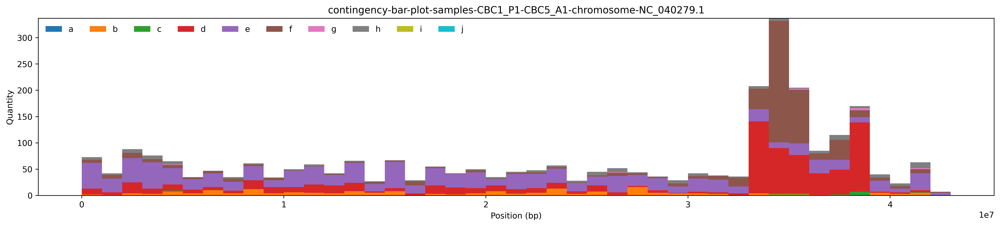

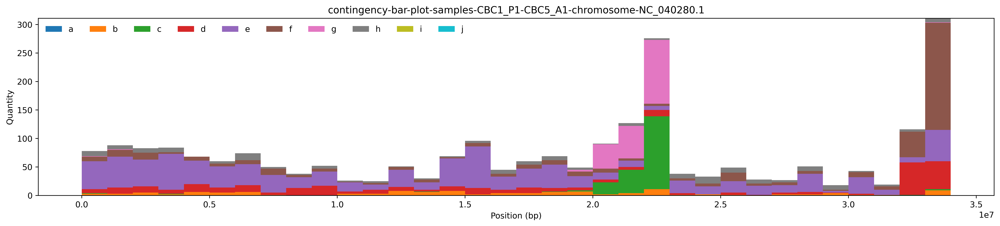

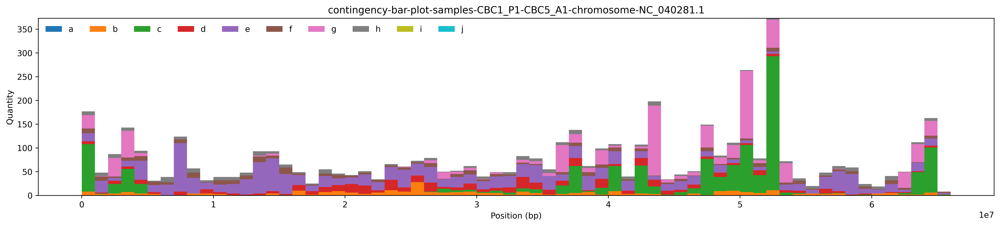

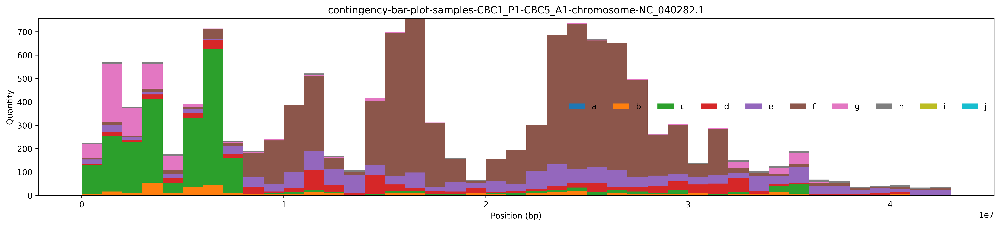

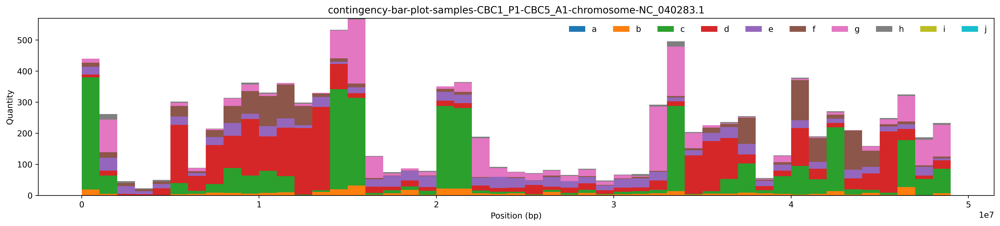

...

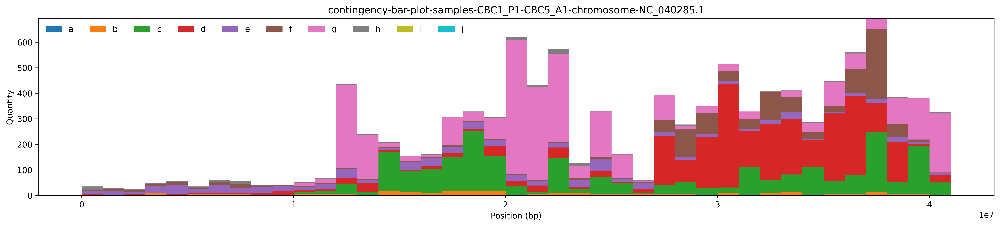

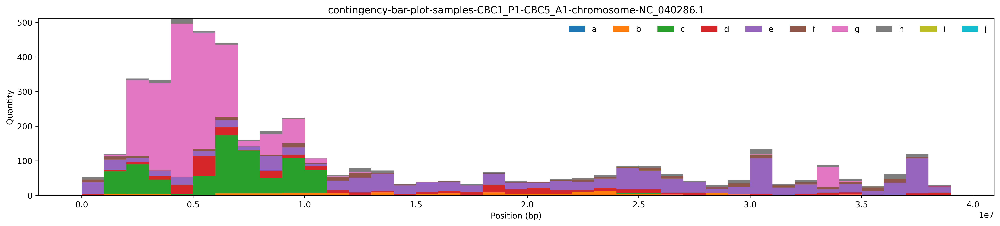

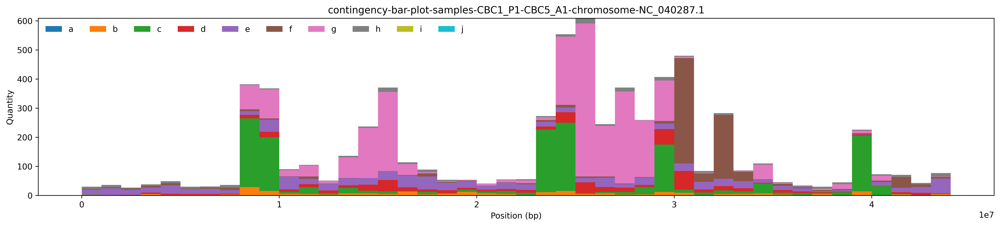

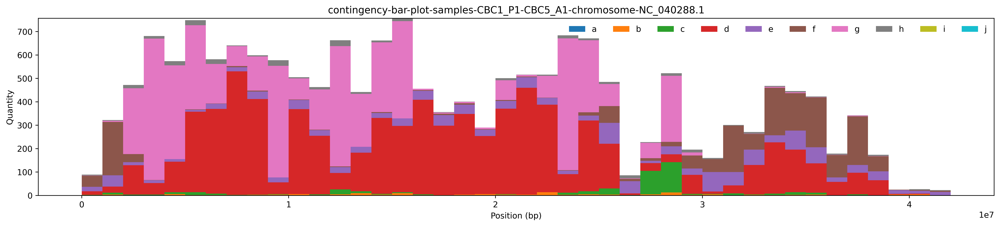

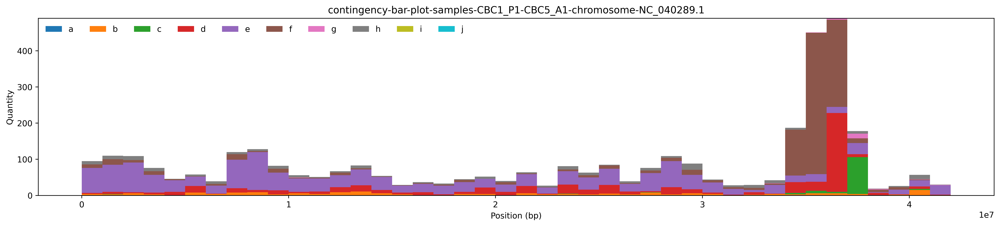

In [57]:
plt.close('all')
window_size = 1000000
CTbarPlots(samples, vcf_df_04, chrom_len_00, window_size)

## <span style="color:blue"> PART 7: Bar Plots per Chromosome</span>

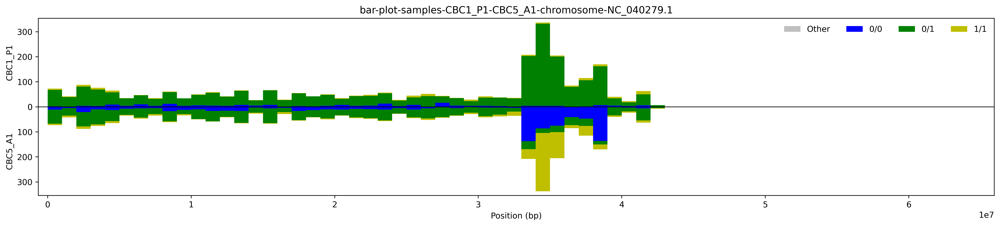

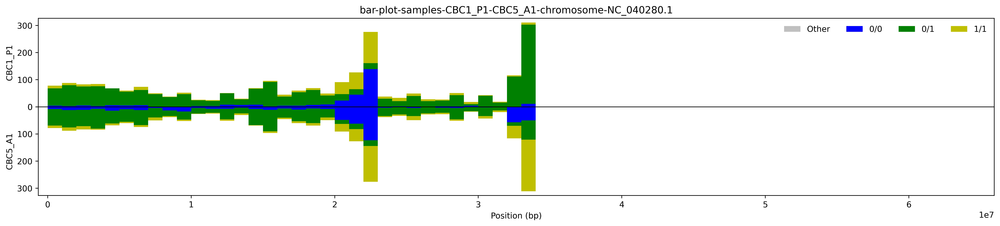

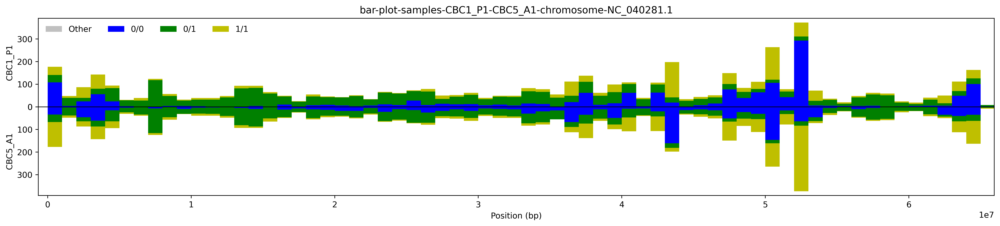

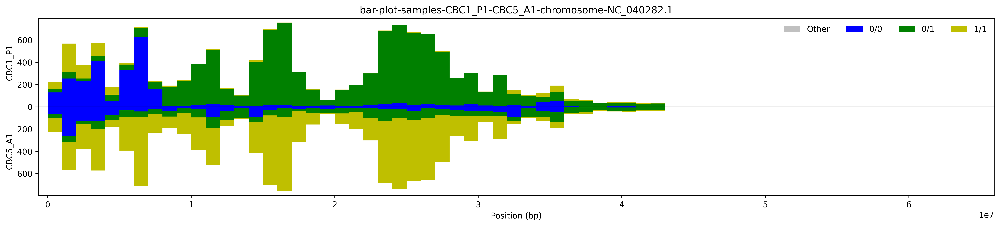

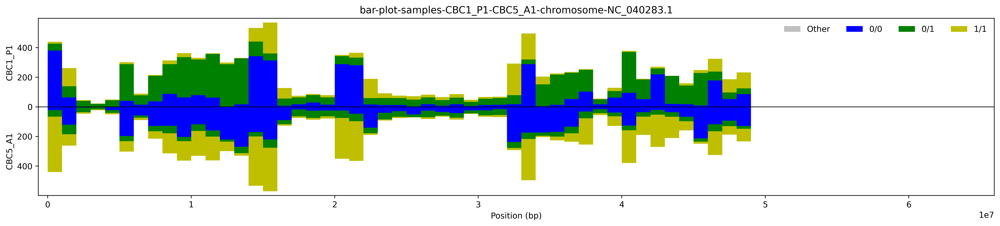

...

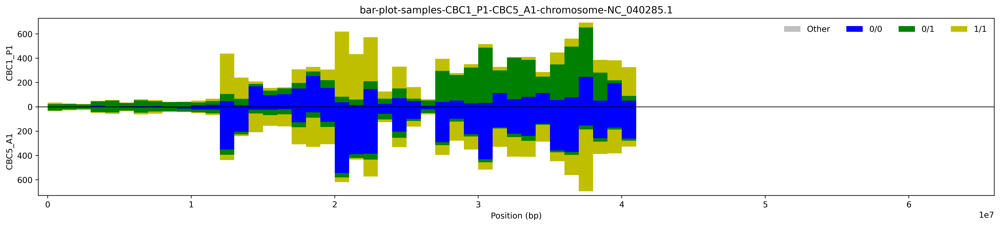

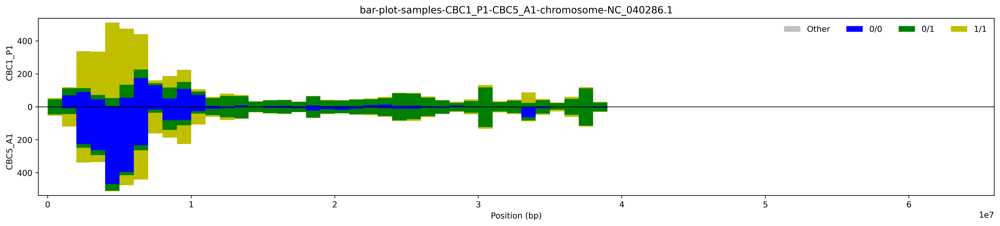

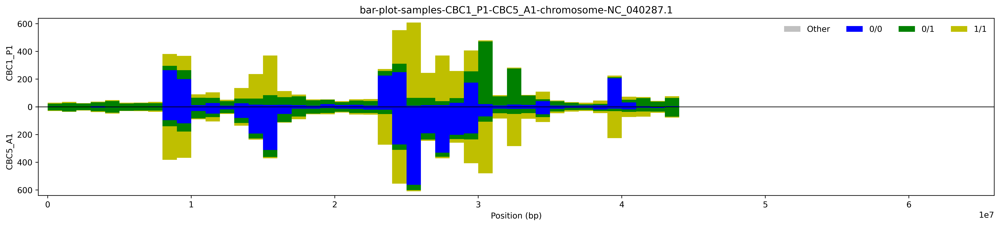

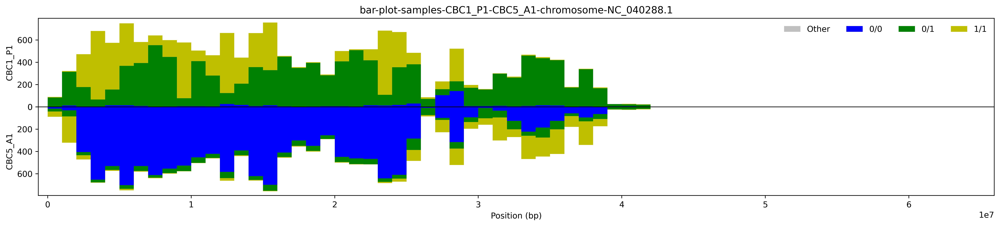

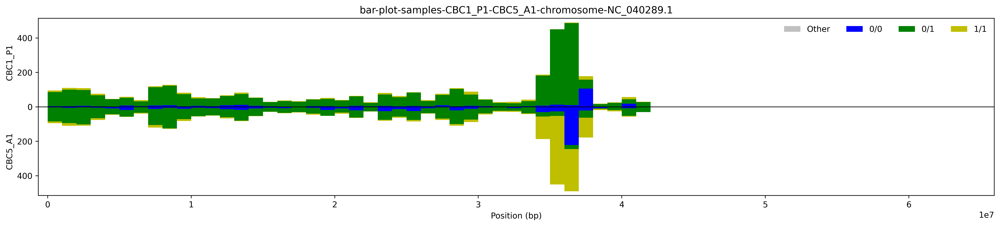

In [58]:
# suppress all the warnings from the inverted tickes of bar plots
import warnings
warnings.filterwarnings('ignore')

plt.close('all')
GTbarPlots(samples, vcf_df_04, chrom_len_00, window_size)

## <span style="color:blue"> PART 8: GT Plots per Chromosome</span>

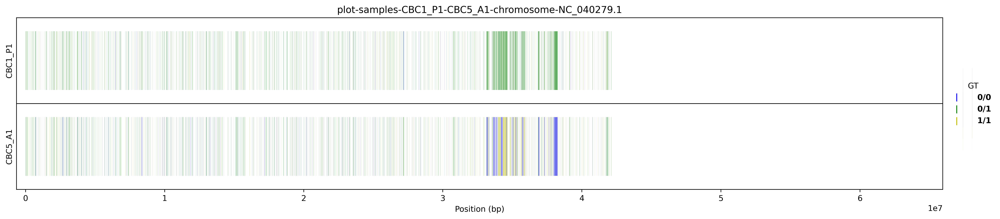

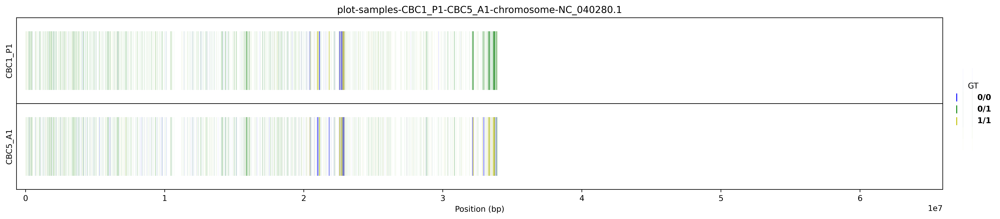

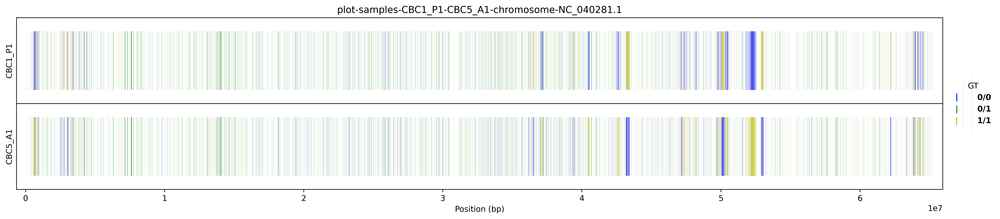

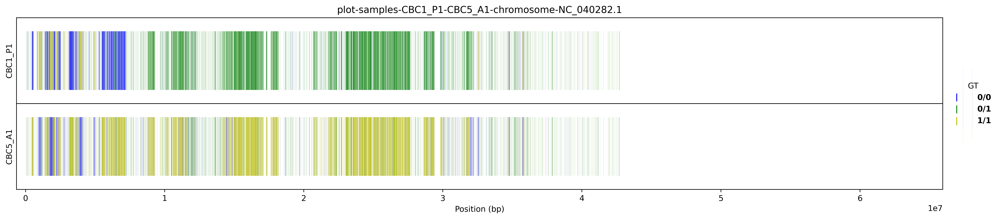

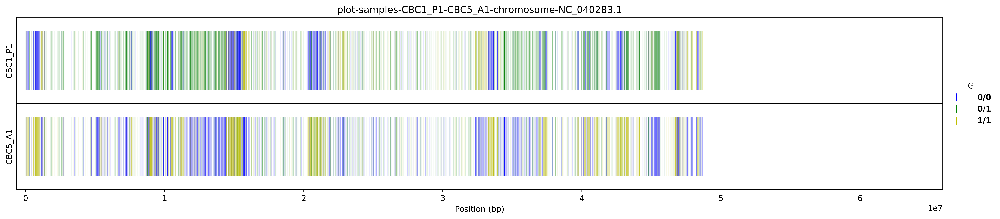

...

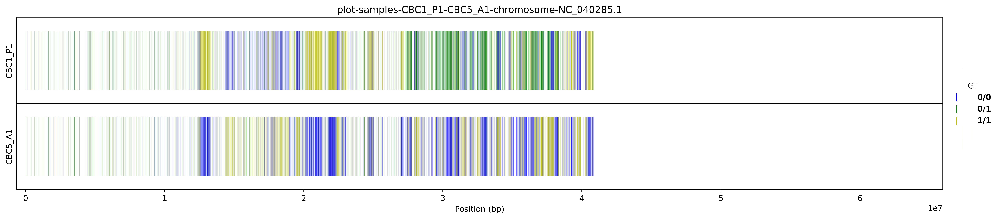

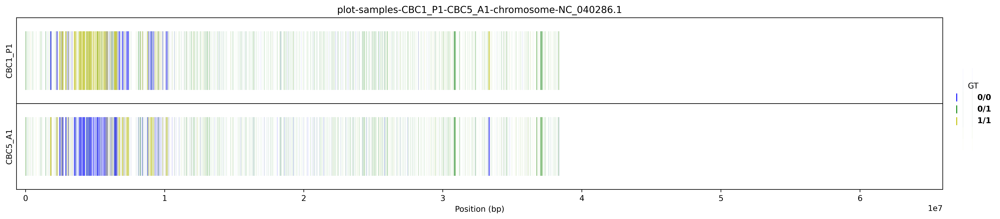

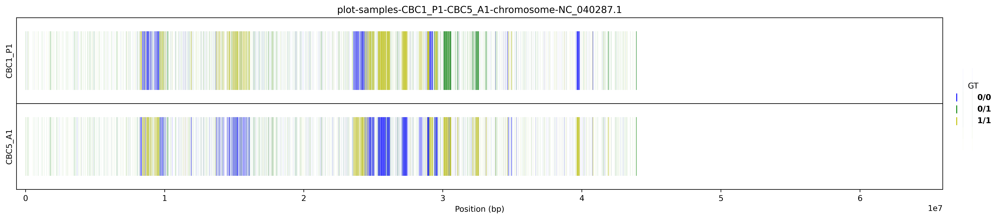

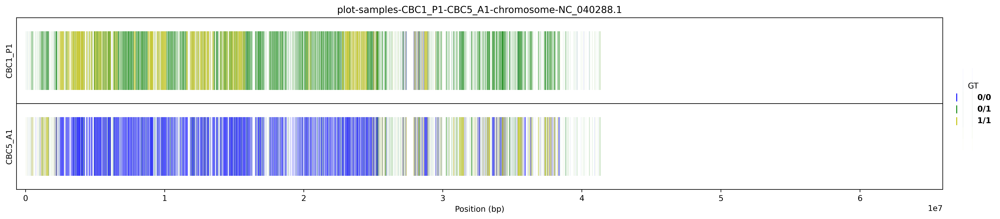

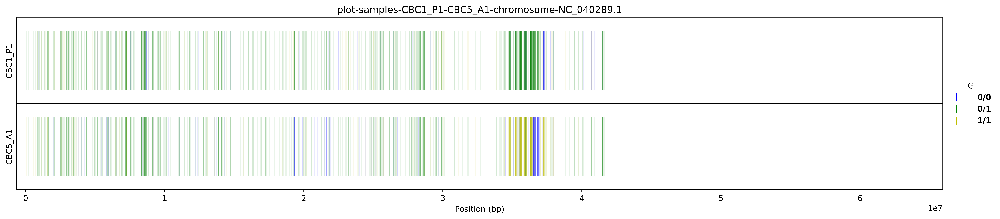

In [59]:
plt.close('all')
GTplots(samples, vcf_df_04, chrom_len_00)

## <span style="color:blue"> PART 9: Contingency Table per Chromosome</span>

In [60]:
import dataframe_image as dfi

for chromosome in chrom_len_00.index:
    chromosome_df = vcf_df_04[ vcf_df_04.CHROM == chromosome ]
    
    # reset chromosome_df indexes for contingency table
    chromosome_df.reset_index(inplace=True, drop=True)
    chromosome_ct = contingency_table(samples, chromosome_df, chromosome)


Contingency Table - Chromosome NC_040279.1

                 CBC5_A1_GT                 
                        0/0   0/1  1/1 other
CBC1_P1_GT 0/0            0   191   17     0
           0/1          818  1049  597     0
           1/1           10   149    0     0
           other          0     0    0     0

Contingency Table - Chromosome NC_040280.1

                 CBC5_A1_GT                
                        0/0  0/1  1/1 other
CBC1_P1_GT 0/0            0  122  199     0
           0/1          317  962  427     0
           1/1          218  177    0     0
           other          0    0    0     0

Contingency Table - Chromosome NC_040281.1

                 CBC5_A1_GT                  
                        0/0   0/1   1/1 other
CBC1_P1_GT 0/0            0   315  1205     0
           0/1          494  1477   351     0
           1/1          915   318     0     0
           other          0     0     0     0

Contingency Table - Chromosome NC_040282.1

          